In [1]:
# procesamiento de datos
import pandas as pd
import numpy as np
# visualizacion de datos
import seaborn as sns
import matplotlib.pyplot as plt
# clasificaicon de datos
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score

In [2]:
# definicion de dataframe principal
ag01 = pd.DataFrame()
ag01_filtrado = pd.DataFrame()

In [3]:
# carga de datos
ag01 = pd.read_csv(r'C:\Users\gabri\OneDrive\Escritorio\Cursos\Data Science\DataScienceCodersHouse\Proyecto Final\ARI_datos_crudos.csv')

C:\Users\gabri\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [4]:
# informacion basica de datos
print(ag01.info())
print(ag01.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166464 entries, 0 to 166463
Data columns (total 8 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Unnamed: 0                                166464 non-null  int64  
 1   fecha                                     166464 non-null  object 
 2   EOL_ARI_AG31_10_Average_VelViento         159032 non-null  float64
 3   EOL_ARI_AG31_10_Deviation_VelViento       159032 non-null  float64
 4   EOL_ARI_AG31_10_Average_TempAmb           163157 non-null  float64
 5   EOL_ARI_AG31_10_Average_PotActiva         159032 non-null  float64
 6   EOL_ARI_AG31_10_Average_Estado            165788 non-null  float64
 7   EOL_ARI_AG31_10_EstadoMasRestrictivoCalc  143192 non-null  object 
dtypes: float64(5), int64(1), object(2)
memory usage: 10.2+ MB
None
          Unnamed: 0  EOL_ARI_AG31_10_Average_VelViento  \
count  166464.000000                      1

In [5]:
#################### limpieza de datos ##############################
 # elimino columna de indice de los datos crudos
ag01 = ag01.drop([ag01.columns[0]],axis=1)
ag01 = ag01.drop([ag01.columns[6]],axis=1) # columna de disponibilidad no sirve para nada
# convierto columnas que necesito del dataframe a valores numericos
for col in range(1,len(ag01.columns)):
    ag01[ag01.columns[col]] = pd.to_numeric(ag01[ag01.columns[col]],errors='coerce')
    
# convierto columna 'fecha' en tipo datetime
ag01['fecha'] = pd.to_datetime(ag01['fecha'])
    
# se filtran nan para poder hacer los analisis de las variables mas ordenadamente
ag01 = ag01.dropna()

In [6]:
##############################################################################
######################## ANALISIS UNIVARIADO #################################
##############################################################################

In [7]:
# UNIVARIADO DE VELOCIDAD
media_de_velocidad_todo_el_perdiodo = ag01[ag01.columns[1]].mean()
mediana_de_velocidad_todo_el_perdiodo = ag01[ag01.columns[1]].median()
moda_de_velocidad_todo_el_perdiodo = ag01[ag01.columns[1]].mode()
print('Media, mediana y moda de velocidad de viento para todo el conjunto de datos')
print('Media de velocidad de viento: ',media_de_velocidad_todo_el_perdiodo)
print('Mediana de velocidad de viento: ',mediana_de_velocidad_todo_el_perdiodo)
print('Moda de velocidad de viento: ',moda_de_velocidad_todo_el_perdiodo)

Media, mediana y moda de velocidad de viento para todo el conjunto de datos
Media de velocidad de viento:  7.7384229481271465
Mediana de velocidad de viento:  7.746333
Moda de velocidad de viento:  0    14.1
dtype: float64


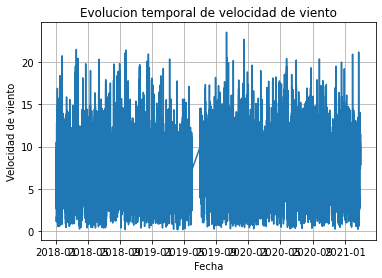

In [8]:
line_velocidad = sns.lineplot(x=ag01['fecha'],y=ag01[ag01.columns[1]],palette='pastel')
line_velocidad.set_title('Evolucion temporal de velocidad de viento')
line_velocidad.set_ylabel('Velocidad de viento')
line_velocidad.set_xlabel('Fecha')
line_velocidad.grid(True)

C:\Users\gabri\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


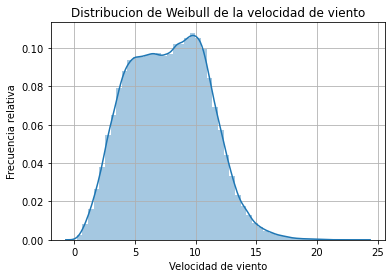

In [9]:
dist_velocidad = sns.distplot(ag01[ag01.columns[1]])
dist_velocidad.set_title('Distribucion de Weibull de la velocidad de viento')
dist_velocidad.set_ylabel('Frecuencia relativa')
dist_velocidad.set_xlabel('Velocidad de viento')
dist_velocidad.grid(True)

Text(0, 0.5, 'Velocidad de viento')

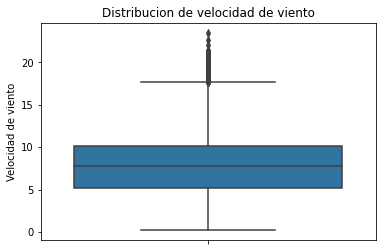

In [10]:
box_velocidad = sns.boxplot(y=ag01[ag01.columns[1]])
box_velocidad.set_title('Distribucion de velocidad de viento')
box_velocidad.set_ylabel('Velocidad de viento')

In [11]:
# UNIVARIADO DE POTENCIA
media_de_potencia_todo_el_perdiodo = ag01[ag01.columns[4]].mean()
mediana_de_potencia_todo_el_perdiodo = ag01[ag01.columns[4]].median()
moda_de_potencia_todo_el_perdiodo = ag01[ag01.columns[4]].mode()
print('Media, mediana y moda de Potencia electrica para todo el conjunto de datos')
print('Media de Potencia electrica: ',media_de_potencia_todo_el_perdiodo)
print('Mediana de Potencia electrica: ',mediana_de_potencia_todo_el_perdiodo)
print('Moda de Potencia electrica: ',moda_de_potencia_todo_el_perdiodo)

Media, mediana y moda de Potencia electrica para todo el conjunto de datos
Media de Potencia electrica:  946.3238529995821
Mediana de Potencia electrica:  773.01
Moda de Potencia electrica:  0    2000.042
dtype: float64


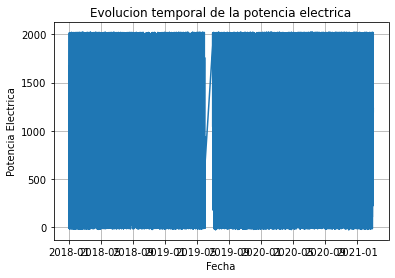

In [12]:
line_potencia = sns.lineplot(x=ag01['fecha'],y=ag01[ag01.columns[4]],palette='pastel')
line_potencia.set_title('Evolucion temporal de la potencia electrica')
line_potencia.set_ylabel('Potencia Electrica')
line_potencia.set_xlabel('Fecha')
line_potencia.grid(True)

C:\Users\gabri\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


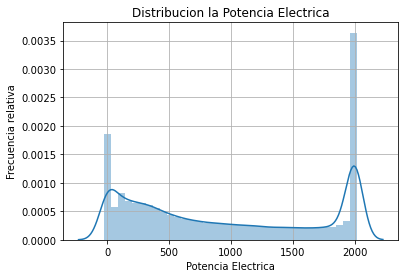

In [16]:
dist_potencia = sns.distplot(ag01[ag01.columns[4]])
dist_potencia.set_title('Distribucion la Potencia Electrica')
dist_potencia.set_ylabel('Frecuencia relativa')
dist_potencia.set_xlabel('Potencia Electrica')
dist_potencia.grid(True)

Text(0, 0.5, 'Potencia Electrica')

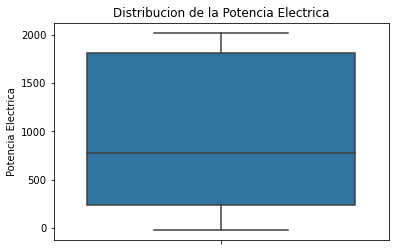

In [17]:
box_potencia = sns.boxplot(y=ag01[ag01.columns[4]])
box_potencia.set_title('Distribucion de la Potencia Electrica')
box_potencia.set_ylabel('Potencia Electrica')

In [18]:
# UNIVARIADO TEMPERATURA
media_de_temperatura_todo_el_perdiodo = ag01[ag01.columns[3]].mean()
mediana_de_temperatura_todo_el_perdiodo = ag01[ag01.columns[3]].median()
moda_de_temperatura_todo_el_perdiodo = ag01[ag01.columns[3]].mode()
print('Media, mediana y moda de temperatura ambiente para todo el conjunto de datos')
print('Media de temperatura ambiente: ',media_de_temperatura_todo_el_perdiodo)
print('Mediana de temperatura ambiente: ',mediana_de_temperatura_todo_el_perdiodo)
print('Moda de temperatura ambiente: ',moda_de_temperatura_todo_el_perdiodo)
        

Media, mediana y moda de temperatura ambiente para todo el conjunto de datos
Media de temperatura ambiente:  17.46170752960135
Mediana de temperatura ambiente:  17.60867
Moda de temperatura ambiente:  0    21.6
dtype: float64


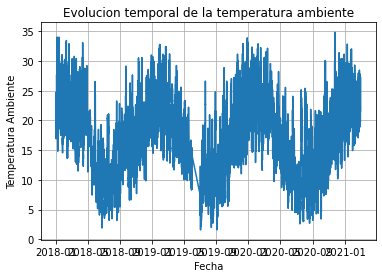

In [19]:
line_temperatura = sns.lineplot(x=ag01['fecha'],y=ag01[ag01.columns[3]],palette='pastel')
line_temperatura.set_title('Evolucion temporal de la temperatura ambiente')
line_temperatura.set_ylabel('Temperatura Ambiente')
line_temperatura.set_xlabel('Fecha')
line_temperatura.grid(True)

C:\Users\gabri\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


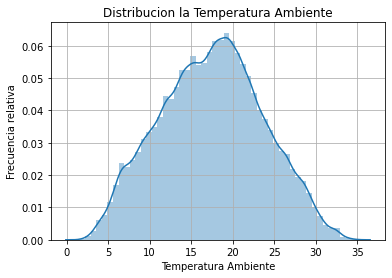

In [20]:
dist_temperatura = sns.distplot(ag01[ag01.columns[3]])
dist_temperatura.set_title('Distribucion la Temperatura Ambiente')
dist_temperatura.set_ylabel('Frecuencia relativa')
dist_temperatura.set_xlabel('Temperatura Ambiente')
dist_temperatura.grid(True)

Text(0, 0.5, 'Temperatura Ambiente')

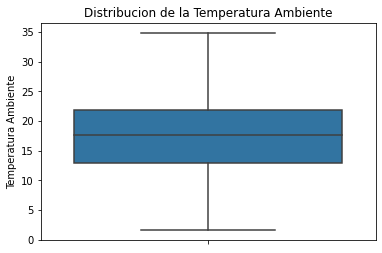

In [21]:
box_temperatura = sns.boxplot(y=ag01[ag01.columns[3]])
box_temperatura.set_title('Distribucion de la Temperatura Ambiente')
box_temperatura.set_ylabel('Temperatura Ambiente')

In [12]:
##############################################################################
######################## ANALISIS BIVARIADO ##################################
##############################################################################
# Se hara analisis unicamente de la potencia y la velocidad, que son las que se
# mas importantes para calcular la curva de potencia
# visualizaciones de curva de potencia

Coeficiente de correlacion en curva de potencia sin filtrar
R2 = 0.686510


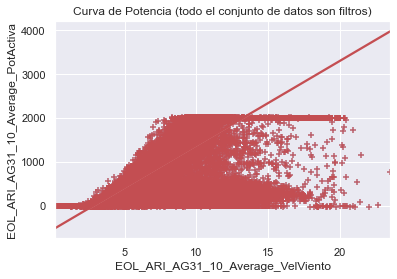

In [13]:
sns.set_theme(color_codes=True)
curva_de_potencia = sns.scatterplot(x=ag01[ag01.columns[1]],y=ag01[ag01.columns[4]],
                                    marker="+",
                                    color='b')
curva_de_potencia.set_title('Curva de Potencia (todo el conjunto de datos son filtros)')
curva_de_potencia.set_ylabel('Potencia')
curva_de_potencia.set_xlabel('Velocidad')                            
                
regresion_lineal = sns.regplot(x=ag01[ag01.columns[1]],y=ag01[ag01.columns[4]],
                                       color='r',marker="+")
print('Coeficiente de correlacion en curva de potencia sin filtrar')
print('R2 = 0.686510')

In [17]:
##############################################################################
###################### DATA CLEANING #########################################
##############################################################################

In [18]:
# filtros de velocidad
ag01_filtrado = ag01[ag01[ag01.columns[1]]>=3.5]
ag01_filtrado = ag01_filtrado[ag01_filtrado[ag01_filtrado.columns[1]]<23]

In [19]:
# filtros de potencia
ag01_filtrado = ag01_filtrado[ag01_filtrado[ag01_filtrado.columns[4]]>350]

In [20]:
# filtros de estado de sistema
ag01_filtrado = ag01_filtrado[ag01_filtrado[ag01_filtrado.columns[5]]!=0]

In [21]:
# vectores de rango 
velocidades_minimas = np.arange(3.5,25,0.4)
for i in range(0,len(velocidades_minimas)):
    velocidades_minimas[i] = (velocidades_minimas[i]**2)/5

In [22]:
# filtros de banda envolvente
# # defino bandas de potencia y de velocidad
zona_1 = [0,50]; velocidad_min_max_1 = [1.5,6]
zona_2 = [51,100]; velocidad_min_max_2 = [1.6,6]
zona_3 = [101,150]; velocidad_min_max_3 = [1.8,6]
zona_4 = [151,200]; velocidad_min_max_4 = [2,7]
zona_5 = [201,250]; velocidad_min_max_5 = [2.3,7]
zona_6 = [251,300]; velocidad_min_max_6 = [2.5,6.6]
zona_7 = [301,350]; velocidad_min_max_7 = [3.5,6.6]
zona_8 = [351,400]; velocidad_min_max_8 = [3.7,6.8]
zona_9 = [401,450]; velocidad_min_max_9 = [4.3,7]
zona_10 = [451,500]; velocidad_min_max_10 = [4.67,7.3]
zona_11 = [501,550]; velocidad_min_max_11 = [5.1,7.45]
zona_12 = [551,600]; velocidad_min_max_12 = [5.32,7.5]
zona_13 = [601,650]; velocidad_min_max_13 = [5.59,7.72]
zona_14 = [651,700]; velocidad_min_max_14 = [5.74,7.82]
zona_15 = [701,750]; velocidad_min_max_15 = [6.07,8.1]
zona_16 = [751,800]; velocidad_min_max_16 = [6.28,8.3]
zona_17 = [801,850]; velocidad_min_max_17 = [6.426,8.5]
zona_18 = [851,900]; velocidad_min_max_18 = [6.66,8.66]
zona_19 = [901,950]; velocidad_min_max_19 = [6.8,8.77]
zona_20 = [951,1000]; velocidad_min_max_20 = [6.9,8.92]
zona_21 = [1001,1050]; velocidad_min_max_21 = [7.09,9]
zona_22 = [1051,1100]; velocidad_min_max_22 = [7.17,9.2]
zona_23 = [1101,1150]; velocidad_min_max_23 = [7.25,9.35]
zona_24 = [1151,1200]; velocidad_min_max_24 = [7.35,9.55]
zona_25 = [1201,1250]; velocidad_min_max_25 = [7.46,9.72]
zona_26 = [1251,1300]; velocidad_min_max_26 = [7.6,9.76]
zona_27 = [1301,1350]; velocidad_min_max_27 = [7.7,9.8]
zona_28 = [1351,1400]; velocidad_min_max_28 = [7.76,9.9]
zona_29 = [1401,1450]; velocidad_min_max_29 = [7.95,10.05]
zona_30 = [1451,1500]; velocidad_min_max_30 = [8.02,10.2]
zona_31 = [1501,1550]; velocidad_min_max_31 = [8.15,10.3]
zona_32 = [1551,1600]; velocidad_min_max_32 = [8.24,10.4]
zona_33 = [1601,1650]; velocidad_min_max_33 = [8.34,10.53]
zona_34 = [1651,1700]; velocidad_min_max_34 = [8.42,10.6]
zona_35 = [1701,1750]; velocidad_min_max_35 = [8.48,10.74]
zona_36 = [1751,1800]; velocidad_min_max_36 = [8.62,10.82]
zona_37 = [1801,1850]; velocidad_min_max_37 = [8.75,10.9]
zona_38 = [1851,1900]; velocidad_min_max_38 = [8.77,11.2]
zona_39 = [1901,1950]; velocidad_min_max_39 = [8.79,11.7]
zona_40 = [1951,2050]; velocidad_min_max_40 = [9.038,25]

In [23]:
# # filtro condicional para bandas 
ag01_filtrado = ag01_filtrado[(ag01_filtrado[ag01_filtrado.columns[4]] >= zona_2[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_2[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_2[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_2[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_3[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_3[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_3[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_3[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_4[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_4[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_4[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_4[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_5[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_5[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_5[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_5[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_6[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_6[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_6[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_6[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_7[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_7[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_7[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_7[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_8[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_8[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_8[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_8[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_9[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_9[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_9[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_9[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_10[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_10[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_10[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_10[1])
                            
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_11[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_11[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_11[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_11[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_12[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_12[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_12[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_12[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_13[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_13[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_13[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_13[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_14[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_14[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_14[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_14[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_15[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_15[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_15[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_15[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_16[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_16[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_16[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_16[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_17[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_17[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_17[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_17[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_18[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_18[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_18[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_18[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_19[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_19[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_19[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_19[1])
                              
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_20[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_20[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_20[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_20[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_21[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_21[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_21[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_21[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_22[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_22[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_22[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_22[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_23[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_23[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_23[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_23[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_24[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_24[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_24[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_24[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_25[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_25[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_25[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_25[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_26[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_26[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_26[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_26[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_27[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_27[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_27[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_27[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_28[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_28[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_28[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_28[1])
                              
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_29[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_29[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_29[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_29[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_30[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_30[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_30[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_30[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_31[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_31[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_31[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_31[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_32[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_32[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_32[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_32[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_33[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_33[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_33[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_33[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_34[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_34[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_34[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_34[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_35[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_35[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_35[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_35[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_36[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_36[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_36[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_36[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_37[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_37[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_37[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_37[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_38[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_38[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_38[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_38[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_39[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_39[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_39[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_39[1])
                              | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_40[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_40[1]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_40[0]) 
                              & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_40[1])
                                ]

In [24]:
# reseteo index
ag01_filtrado = ag01_filtrado.reset_index(drop=True)

In [25]:
# creo columna en dataframe principal que marca con un true los datos que pertenecen a la curva de potencia filtrada
ag01['dentro de curva'] = ag01_filtrado[ag01_filtrado.columns[4]] >= zona_2[0] & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_2[1])& (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_2[0])& (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_2[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_3[0])& (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_3[1])& (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_3[0])& (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_3[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_4[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_4[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_4[0])& (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_4[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_5[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_5[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_5[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_5[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_6[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_6[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_6[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_6[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_7[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_7[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_7[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_7[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_8[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_8[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_8[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_8[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_9[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_9[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_9[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_9[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_10[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_10[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_10[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_10[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_11[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_11[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_11[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_11[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_12[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_12[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_12[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_12[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_13[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_13[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_13[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_13[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_14[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_14[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_14[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_14[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_15[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_15[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_15[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_15[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_16[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_16[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_16[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_16[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_17[0])  & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_17[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_17[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_17[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_18[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_18[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_18[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_18[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_19[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_19[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_19[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_19[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_20[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_20[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_20[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_20[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_21[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_21[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_21[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_21[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_22[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_22[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_22[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_22[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_23[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_23[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_23[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_23[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_24[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_24[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_24[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_24[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_25[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_25[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_25[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_25[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_26[0])  & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_26[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_26[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_26[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_27[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_27[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_27[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_27[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_28[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_28[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_28[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_28[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_29[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_29[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_29[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_29[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_30[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_30[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_30[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_30[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_31[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_31[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_31[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_31[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_32[0])  & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_32[1])  & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_32[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_32[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_33[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_33[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_33[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_33[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_34[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_34[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_34[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_34[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_35[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_35[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_35[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_35[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_36[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_36[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_36[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_36[1]) | (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_37[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_37[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_37[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_37[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_38[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_38[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_38[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_38[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_39[0])  & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_39[1])  & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_39[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_39[1])| (ag01_filtrado[ag01_filtrado.columns[4]] >= zona_40[0]) & (ag01_filtrado[ag01_filtrado.columns[4]] <= zona_40[1]) & (ag01_filtrado[ag01_filtrado.columns[1]] >= velocidad_min_max_40[0]) & (ag01_filtrado[ag01_filtrado.columns[1]] <= velocidad_min_max_40[1])

In [26]:
# clasificacion de datos
# cambio datos true por 1
ag01['dentro de curva'] = ag01['dentro de curva'].map({ag01['dentro de curva'].unique()[0]:1,ag01['dentro de curva'].unique()[1]:0})
# y como los datos que no pertenecen a la curva estan marcados con un nan, los cambio por 0

Coeficiente de correlacion en curva de potencia sin filtrar
R2 = 0.686510
Coeficiente de correlacion de curva de potencia despues de filtrado
R2 = 0.923241


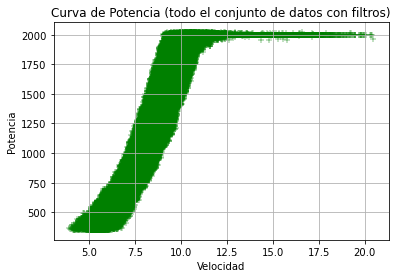

In [27]:
# visualizacion de datos despues de filtrado
curva_de_potencia_filtrada = sns.scatterplot(x=ag01_filtrado[ag01_filtrado.columns[1]],
                                                y=ag01_filtrado[ag01_filtrado.columns[4]],
                                                marker="+",
                                                color='g')
curva_de_potencia_filtrada.set_title('Curva de Potencia (todo el conjunto de datos con filtros)')
curva_de_potencia_filtrada.set_ylabel('Potencia')
curva_de_potencia_filtrada.set_xlabel('Velocidad')               
curva_de_potencia_filtrada.grid(True)             
print('Coeficiente de correlacion en curva de potencia sin filtrar')
print('R2 = 0.686510')
    
print('Coeficiente de correlacion de curva de potencia despues de filtrado')
print('R2 = 0.923241')

In [28]:
###############################################################################
###################### ALGORITMO DE CLASIFICACION DE DATOS ####################
###############################################################################
# algoritmo de clasificacion RANDOM FOREST

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

In [30]:
features = [ag01.columns[1],ag01.columns[2],ag01.columns[3],ag01.columns[4],ag01.columns[5]]
target = ['dentro de curva']

In [28]:
#Seleccionamos todas las columnas
X = ag01[features]
    
#Defino los datos correspondientes a las etiquetas
y = ag01[target]

In [29]:
# # se prueba un algoritmo de cross validation 
# tree = DecisionTreeClassifier(max_depth=5,criterion= 'gini',random_state = 123)
# scores = cross_val_score(tree, X,y,cv=5, scoring='f1_macro')
# print(scores)
# [0.52243055 0.39370119 0.35700475 0.44964004 0.3685415 ]
# print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
# 0.42 accuracy with a standard deviation of 0.06

In [30]:
# split de datos con validacion cruzada con KFold
# from sklearn.model_selection import KFold
# kf = KFold(n_splits=5, shuffle=False)
# kf.get_n_splits(X)    
# for x_values, y_values in kf.split(X):
#     print(ag01.iloc[x_values],ag01.iloc[y_values])
# for train_index, test_index in kf.split(X):
#     X_train, X_test = X[train_index], X[test_index]
#     y_train, y_test = y[train_index], y[test_index]
#     # X_train = X_train.values.reshape([X_train.values.shape[0],1])
#     # X_test = X_test.values.reshape([X_test.values.shape[0],1])

In [31]:
# Separo los datos de "train" en entrenamiento y prueba para probar los algoritmos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33,
                                                    shuffle=True)

In [32]:
#Se escalan todos los datos
from sklearn.preprocessing import StandardScaler
escalar = StandardScaler()
X_train = escalar.fit_transform(X_train)
X_test = escalar.transform(X_test)    

In [33]:
# #Creamos un arbol de decisión sencillo y lo fiteamos
tree = DecisionTreeClassifier(max_depth=5,criterion= 'gini',random_state = 123)
tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, random_state=123)

In [34]:
y_test_pred = tree.predict(X_test) #Prediccion en Test

In [36]:
from sklearn.metrics import accuracy_score

#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)
  
print('% de aciertos sobre el set de evaluación 1:',test_accuracy*100,'%')

% de aciertos sobre el set de evaluación 1: 60.69625197690593 %


In [37]:
# creo modelo de random forest
model = RandomForestClassifier(random_state=7, n_estimators=150, criterion="entropy",
                                class_weight="balanced", max_features="sqrt", n_jobs=6) # 99997, 614
model.fit(X_train, y_train)

<ipython-input-37-ad6f2eced6c0>:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_features='sqrt', n_estimators=150, n_jobs=6,
                       random_state=7)

In [38]:
y_test_pred = model.predict(X_test) #Prediccion en Test

Matriz de Confusión:
[[ 8642 12655]
 [ 7174 24010]]


C:\Users\gabri\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


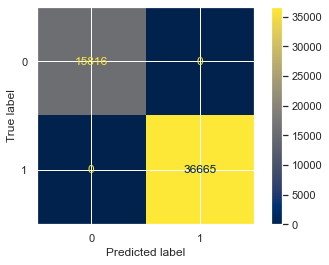

In [39]:
#Verifico la matriz de Confusión
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
# muestro graficamente matriz de confusion 
confusion_matrix(y_test, y_test_pred)
    
matriz = confusion_matrix(y_test, y_test_pred)
print('Matriz de Confusión:')
print(matriz)
matriz_LR = plot_confusion_matrix(model, X_test, y_test_pred,
                                      cmap='cividis')  

In [40]:
y_train_pred = model.predict(X_train)

In [41]:
train_accuracy = accuracy_score(y_train, y_train_pred)
print('Precision del conjunto de train:')
print(train_accuracy*100)    

Precision del conjunto de train:
100.0


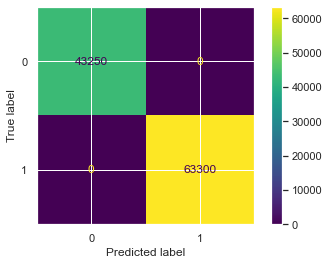

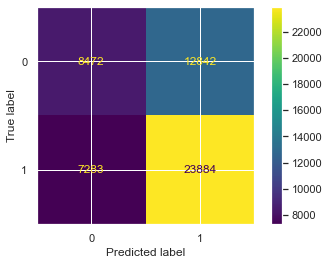

In [54]:
# matrices de confusion
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# train set
matriz_train = confusion_matrix(y_train, y_train_pred)  
train_matrriz = ConfusionMatrixDisplay(confusion_matrix=matriz_train)
train_matrriz.plot()

y_test_pred = model.predict(X_test)
matriz_test = confusion_matrix(y_test, y_test_pred)  
test_matrriz = ConfusionMatrixDisplay(confusion_matrix=matriz_test)
test_matrriz.plot()

In [42]:
#Calculo la exactitud del modelo
from sklearn.metrics import accuracy_score
    
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)
   
print('% de aciertos sobre el set de evaluación del random forest:',test_accuracy*100,'%')

% de aciertos sobre el set de evaluación del random forest: 62.216802271298185 %


In [33]:
###############################################################################
###################### ALGORITMO DE PREDICCION DE DATOS #######################
###############################################################################
# se utiliza un algoritmo de redes neuronales para la prediccion de la potencia

In [34]:
# algoritmo de prediccion de curva de potencia
features = [ag01_filtrado.columns[1],ag01_filtrado.columns[2],ag01_filtrado.columns[3]]
target = [ag01_filtrado.columns[4]]

In [35]:
#Seleccionamos todas las columnas
X = ag01_filtrado[features]
    
#Defino los datos correspondientes a las etiquetas
y = ag01_filtrado[target]

In [36]:
# librerias para visualizacion
import plotly.express as px
from plotly.offline import plot
    
datos_entrada = px.scatter(x=X[X.columns[0]],y=y[y.columns[0]])
# plot(datos_entrada,filename='datos entrada')
datos_entrada.show()

In [37]:
#Separo los datos de "train" en entrenamiento y prueba para probar los algoritmos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    
# separo una variable de velocidad para graficar en el final
velocidad_para_graficar = X_test[X_test.columns[0]].copy()

In [38]:
#Se escalan todos los datos
from sklearn.preprocessing import StandardScaler
escalar = StandardScaler()
X_train = escalar.fit_transform(X_train)
X_test = escalar.fit_transform(X_test)

In [39]:
import tensorflow as tf
# definicion de modelo
modelo = tf.keras.Sequential()
    
# capas
# 1 
modelo.add(tf.keras.layers.Dense(units=10, input_shape=[3], activation='softplus'))
# 2
#modelo.add(tf.keras.layers.Dense(units=10, activation='tanh'))
# 3
modelo.add(tf.keras.layers.Dense(units=10, activation='tanh'))
# salida
modelo.add(tf.keras.layers.Dense(units=1))

In [40]:
 # parametros de modelo
optimizador = tf.keras.optimizers.Adam(0.01)
funcion_de_perdidas = 'mean_squared_error'

In [41]:
# compilacion de modelo
modelo.compile(
optimizer=optimizador,
loss=funcion_de_perdidas,
metrics=[tf.keras.metrics.Accuracy()])

In [42]:
# entrenamiento y evaluacion del modelo
print("Comenzando entrenamiento...")
historial = modelo.fit(X_train, y_train, epochs=50, verbose=False)
print("Modelo entrenado!")

Comenzando entrenamiento...
Modelo entrenado!


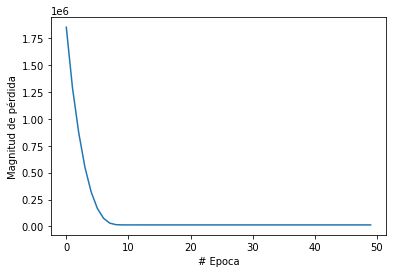

In [43]:
# visualizacion de evolucion de la funcion de perdida en funcion del epoch
import matplotlib.pyplot as plt
plt.xlabel("# Epoca")
plt.ylabel("Magnitud de pérdida")
plt.plot(historial.history["loss"])

In [44]:
# prediccion y metricas del modelo
prediccion = modelo.predict(X_test)
# accuracy
precision_modelo = tf.keras.metrics.Accuracy()
precision_modelo.update_state(y_test, prediccion) 
print('Accuracy del modelo:',precision_modelo.result())

Accuracy del modelo: tf.Tensor(0.0, shape=(), dtype=float32)


In [45]:
# preparacion datos para regresion
real = []; predecido = [] 
for i in range(0,len(y_test)):
    predecido.append(prediccion[i][0])
    real.append(y_test.values[i][0])

In [47]:
# realidad vs resultados
import plotly.graph_objects as go
from plotly.subplots import make_subplots
    
trace1 = go.Scatter(
    x=velocidad_para_graficar,
    y=real,
    name='Datos reales',
    mode = 'markers',
    opacity=0.4           
    )
trace2 = go.Scatter(
        x=velocidad_para_graficar,
        y=predecido,
        name='Prediccion',
        mode = 'markers',
        opacity=0.7
    )

    
# fig = make_subplots(specs=[[{"secondary_y": True}]])
fig = make_subplots()
fig.add_trace(trace1)
    # fig.add_trace(trace2, secondary_y=True)
fig.add_trace(trace2)
    
fig.update_layout(xaxis=dict(tickangle=90))
fig.show()

In [49]:
# metricas para evaluar resultados
# se selecciona la raiz cuadrada del error cuadratico medio, ya que se pude comparar directamente con los datos utilizados
# realizar la prediccion
from sklearn.metrics import mean_squared_error
RMSE = mean_squared_error(y_test, prediccion)
print(f'Raiz del error cuadratico medio:{RMSE/1000}KW')

Raiz del error cuadratico medio:14.405004094424504KW


In [50]:
# comparo el rmse con los datos y obtengo el error en porcentaje
comparacion_error = (RMSE/1000)/np.mean(y_test) * 100
print(f'Error prediccion vs real:{comparacion_error} %')

Error prediccion vs real:EOL_ARI_AG31_10_Average_PotActiva    1.057725
dtype: float64 %
